# **MRI Style Transfer**

Misdiagnosis in the medical field is a very serious issue but it’s also uncomfortably common to occur. Imaging procedures in the medical field requires an expert radiologist’s opinion since interpreting them is not a simple binary process ( Normal or Abnormal). Even so, one radiologist may see something that another does not. This can lead to conflicting reports and make it difficult to effectively recommend treatment options to the patient.

One of the complicated tasks in medical imaging is to diagnose MRI(Magnetic Resonance Imaging). Sometimes to interpret the scan, the radiologist needs different variations of the imaging which can drastically enhance the accuracy of diagnosis by providing practitioners with a more comprehensive understanding.

 

 

But to have access to different imaging is difficult and expensive. With the help of deep learning, we can use style transfer to generate artificial MRI images of different contrast levels from existing MRI scans. This will help to provide a better diagnosis with the help of an additional image.

## **Problem statement:** 

To build a Generative adversarial model(modified U-Net) which can generate artificial MRI images of different contrast levels from existing MRI scans.

# 1. Importing Libaries
Import the images & create two seperate datasets. The input shape for image should be (256, 256)


In [1]:
#Import all the required libraries

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import glob
import random
import os
import pathlib

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 2. Data Understanding & Preparation

In [3]:
BATCH_SIZE = 8
BUFFER_SIZE = 1000
img_height = 256
img_width = 256

In [4]:
data_dir_t1 = pathlib.Path("/content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/MRI+T1_T2+Dataset/Tr1")
data_dir_t2 = pathlib.Path("/content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/MRI+T1_T2+Dataset/Tr2")

In [5]:
tr1_train = tf.keras.preprocessing.image_dataset_from_directory(
                              data_dir_t1,
                              seed=123,
                              validation_split = 0.075,
                              subset = 'training',
                              labels=None,
                              image_size = (img_height, img_width),
                              batch_size=BATCH_SIZE)

tr2_train = tf.keras.preprocessing.image_dataset_from_directory(
                              data_dir_t2,
                              seed=123,
                              validation_split = 0.075,
                              subset = 'training',
                              labels=None,
                              image_size = (img_height, img_width),
                              batch_size=BATCH_SIZE)

tr1_test = tf.keras.preprocessing.image_dataset_from_directory(
                              data_dir_t1,
                              seed=123,
                              validation_split = 0.075,
                              subset = 'validation',
                              labels=None,
                              image_size = (img_height, img_width),
                              batch_size=1)

tr2_test = tf.keras.preprocessing.image_dataset_from_directory(
                              data_dir_t2,
                              seed=123,
                              validation_split = 0.075,
                              subset = 'validation',
                              labels=None,
                              image_size = (img_height, img_width),
                              batch_size=1)

Found 43 files belonging to 1 classes.
Using 40 files for training.
Found 46 files belonging to 1 classes.
Using 43 files for training.
Found 43 files belonging to 1 classes.
Using 3 files for validation.
Found 46 files belonging to 1 classes.
Using 3 files for validation.


In [6]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
tr1 = tr1_train.cache().shuffle(BUFFER_SIZE).prefetch(buffer_size=AUTOTUNE)
tr1_test = tr1_test.cache().prefetch(buffer_size=AUTOTUNE)

tr2 = tr2_train.cache().shuffle(BUFFER_SIZE).prefetch(buffer_size=AUTOTUNE)
tr2_test = tr2_test.cache().prefetch(buffer_size=AUTOTUNE)

#3. Data Preprocessing 
1.Create a function to process your images with normalisation

2.Apply the function to both the datasets 

3.Visualise the MRI images after processing




In [7]:
# normalizing the images to [-1, 1]
def normalize(image):
    image = (image/127.5) - 1.0
    return image

In [8]:
def preprocess_image_train(image):
    image = tf.image.random_flip_left_right(image)
    image = normalize(image)
    return image

In [9]:
# process both classes of MRI images

tr1 = tr1.map(lambda x: (preprocess_image_train(x)))
tr2 = tr2.map(lambda x: (preprocess_image_train(x)))
tr1_test = tr1_test.map(lambda x: (preprocess_image_train(x)))
tr2_test = tr2_test.map(lambda x: (preprocess_image_train(x)))

In [11]:
sample_tr1 = next(iter(tr1))
sample_tr2 = next(iter(tr2))

In [12]:
sample_tr1.shape

TensorShape([8, 256, 256, 3])

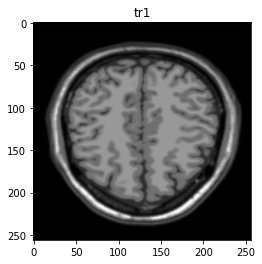

In [13]:
plt.title('tr1')
plt.imshow(sample_tr1[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')

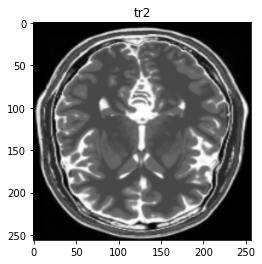

In [14]:
plt.title('tr2')
plt.imshow(sample_tr2[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')

#4. Model Building
The architecture of generator is a modified U-Net.

1.Create your Generator & Discriminator

2.Define the loss functions

3.Create the train_step function

In [16]:
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    if apply_norm:
        result.add(InstanceNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    result.add(InstanceNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

In [17]:
def unet_generator():
    down_stack = [
        downsample(64, 4, False),
        downsample(128, 4),
        downsample(128, 4),
        downsample(128, 4),
        downsample(128, 4)
    ]
    up_stack = [
        upsample(128, 4, True),
        upsample(128, 4, True),
        upsample(128, 4),
        upsample(64, 4)
    ]    
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 256, 2 56, 3)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[img_height, img_width, 3])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

In [18]:
generator_g = unet_generator()
generator_f = unet_generator()

In [19]:
generator_g.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, 64, 64, 128)  131328      sequential[0][0]                 
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, 32, 32, 128)  262400      sequential_1[0][0]               
______________________________________________________________________________________________

In [20]:
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[img_height, img_width, 3], name='input_image')
    x = inp
    down1 = downsample(64, 4, False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
    return tf.keras.Model(inputs=inp, outputs=last)

In [21]:
discriminator_x = discriminator()
discriminator_y = discriminator()

In [22]:
discriminator_x.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_image (InputLayer)     [(None, 256, 256, 3)]     0         
_________________________________________________________________
sequential_18 (Sequential)   (None, 128, 128, 64)      3072      
_________________________________________________________________
sequential_19 (Sequential)   (None, 64, 64, 128)       131328    
_________________________________________________________________
sequential_20 (Sequential)   (None, 32, 32, 256)       524800    
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 34, 34, 256)       0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 31, 31, 512)       2097152   
_________________________________________________________________
instance_normalization_18 (I (None, 31, 31, 512)       1024

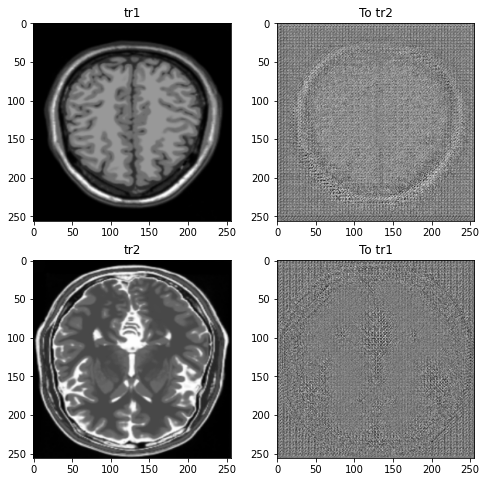

In [23]:
to_tr2 = generator_g(sample_tr1)
to_tr1 = generator_f(sample_tr2)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_tr1, to_tr2, sample_tr2, to_tr1]
title = ['tr1', 'To tr2', 'tr2', 'To tr1']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    if i % 2 == 0:
        plt.imshow(imgs[i][0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
    else:
        plt.imshow(imgs[i][0].numpy()[:, :, 0] * 0.5 * contrast + 0.5, cmap='gray')
plt.show()

In [24]:
LAMBDA = 10.0

In [25]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True) 

In [26]:
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

In [27]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

In [28]:
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss1

In [29]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

In [30]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

#5. Model Training

In [37]:
EPOCHS = 200

In [32]:
parent_dir = '/content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/'
dir = 'Trained_Models'
path = os.path.join(parent_dir, dir)

if os.path.exists(path)==False:
  os.mkdir(path)

In [33]:
checkpoint_path = path

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=EPOCHS)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

In [35]:
def generate_images(model1, test1, model2, test2):
    prediction1 = model1(test1)
    prediction2 = model2(test2)
    plt.figure(figsize=(10, 10))
    display_list = [test1[0], prediction1[0], test2[0], prediction2[0]]
    title = ['Input TR1 Image', 'Predicted TR2 Image', 'Input TR2 Image', 'Predicted TR1 Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
        plt.axis('off')
    plt.show()

In [36]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X.
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)
        
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
        
        # Total generator loss = adversarial loss + cycle loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        

        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
        
    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    
    # Apply the gradients to the optimizer
    
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

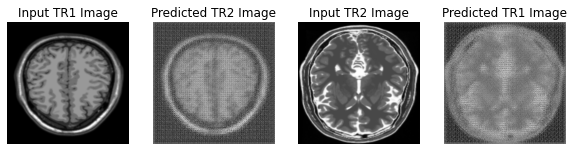

Saving checkpoint for epoch 1 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-1


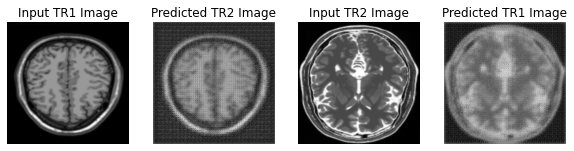

Saving checkpoint for epoch 2 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-2


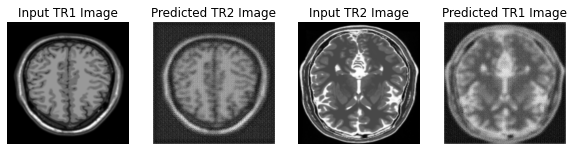

Saving checkpoint for epoch 3 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-3


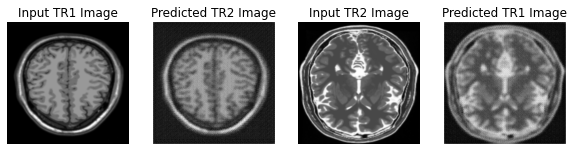

Saving checkpoint for epoch 4 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-4


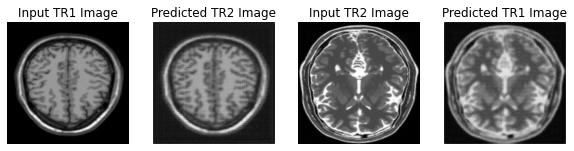

Saving checkpoint for epoch 5 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-5


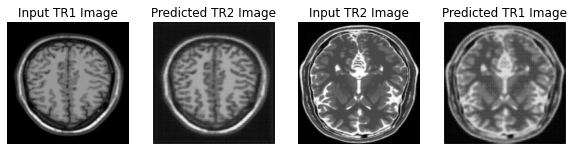

Saving checkpoint for epoch 6 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-6


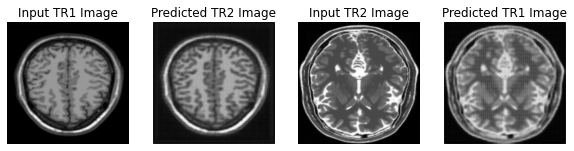

Saving checkpoint for epoch 7 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-7


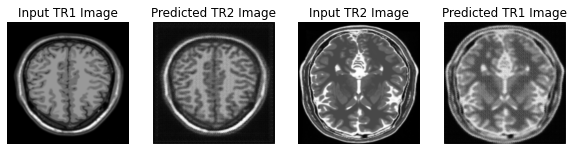

Saving checkpoint for epoch 8 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-8


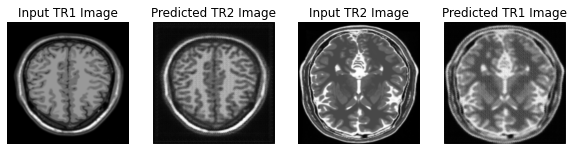

Saving checkpoint for epoch 9 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-9


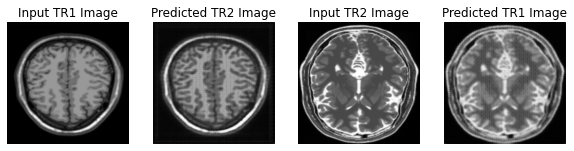

Saving checkpoint for epoch 10 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-10


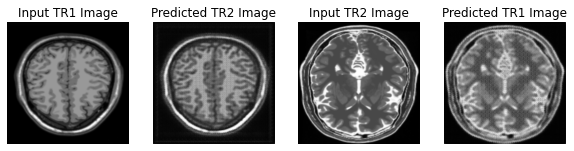

Saving checkpoint for epoch 11 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-11


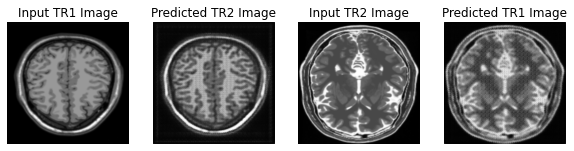

Saving checkpoint for epoch 12 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-12


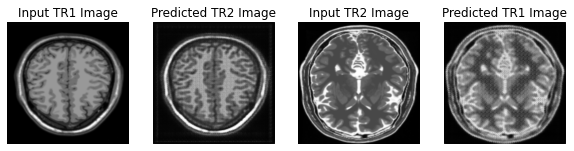

Saving checkpoint for epoch 13 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-13


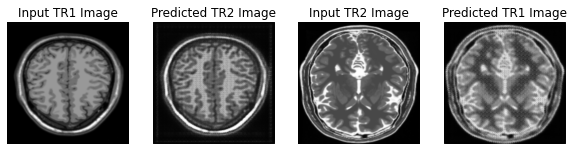

Saving checkpoint for epoch 14 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-14


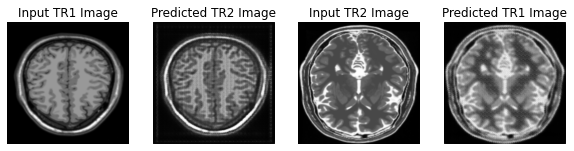

Saving checkpoint for epoch 15 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-15


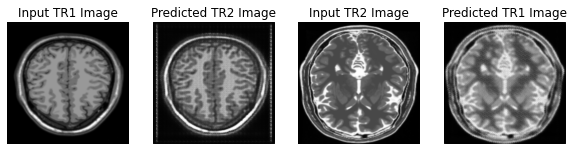

Saving checkpoint for epoch 16 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-16


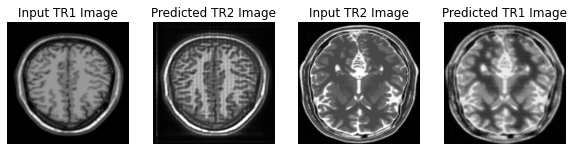

Saving checkpoint for epoch 17 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-17


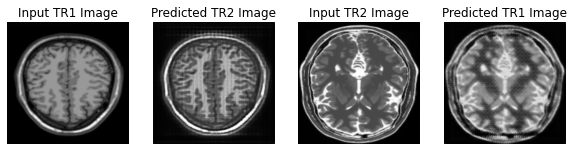

Saving checkpoint for epoch 18 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-18


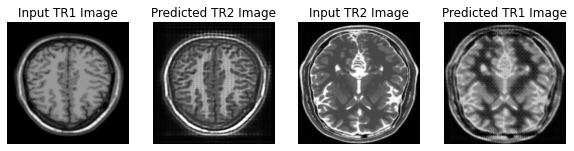

Saving checkpoint for epoch 19 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-19


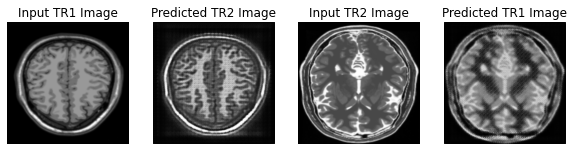

Saving checkpoint for epoch 20 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-20


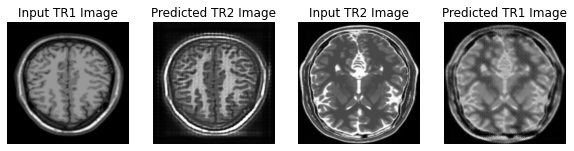

Saving checkpoint for epoch 21 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-21


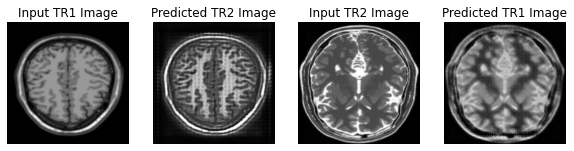

Saving checkpoint for epoch 22 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-22


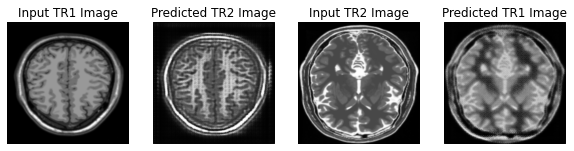

Saving checkpoint for epoch 23 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-23


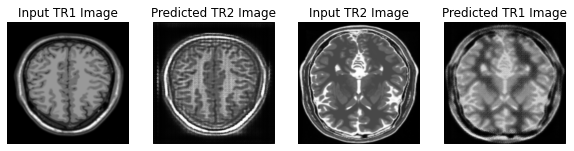

Saving checkpoint for epoch 24 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-24


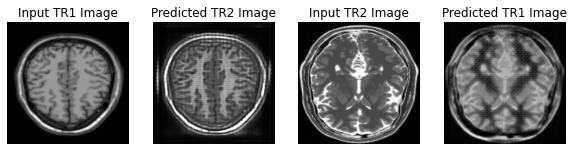

Saving checkpoint for epoch 25 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-25


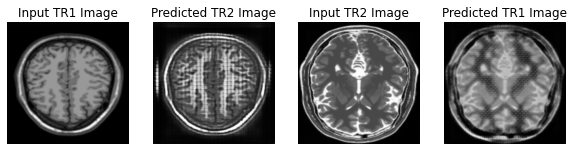

Saving checkpoint for epoch 26 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-26


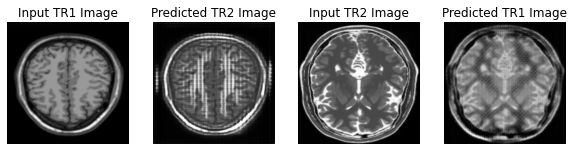

Saving checkpoint for epoch 27 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-27


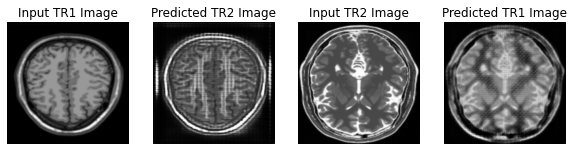

Saving checkpoint for epoch 28 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-28


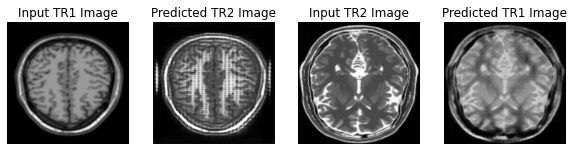

Saving checkpoint for epoch 29 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-29


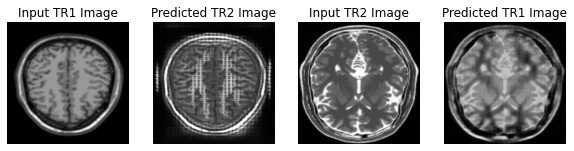

Saving checkpoint for epoch 30 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-30


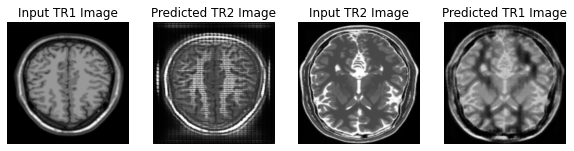

Saving checkpoint for epoch 31 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-31


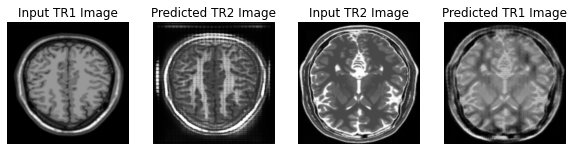

Saving checkpoint for epoch 32 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-32


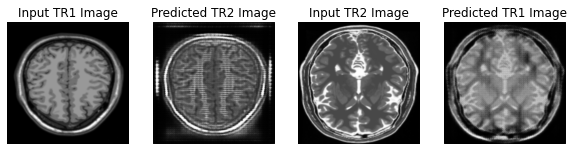

Saving checkpoint for epoch 33 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-33


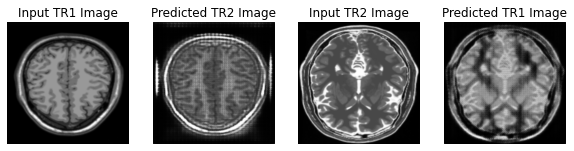

Saving checkpoint for epoch 34 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-34


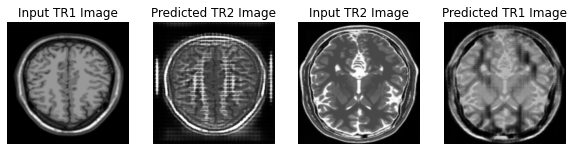

Saving checkpoint for epoch 35 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-35


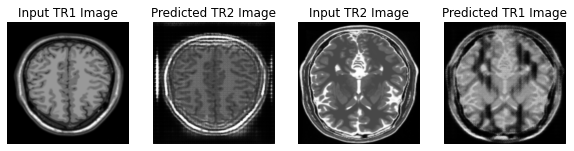

Saving checkpoint for epoch 36 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-36


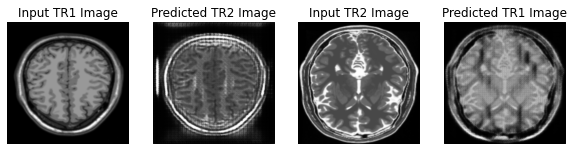

Saving checkpoint for epoch 37 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-37


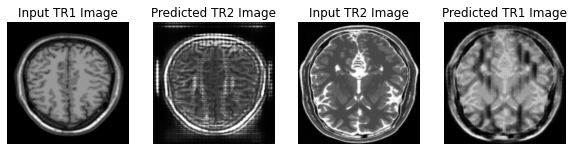

Saving checkpoint for epoch 38 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-38


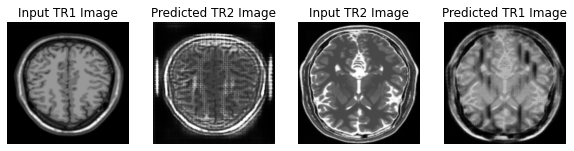

Saving checkpoint for epoch 39 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-39


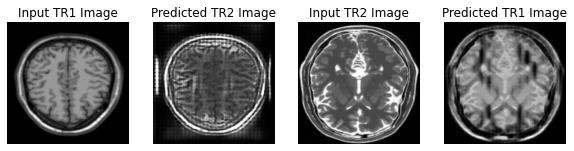

Saving checkpoint for epoch 40 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-40


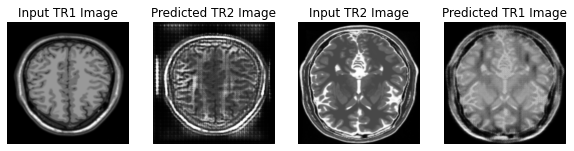

Saving checkpoint for epoch 41 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-41


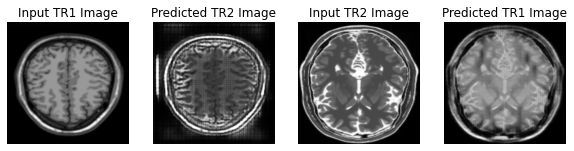

Saving checkpoint for epoch 42 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-42


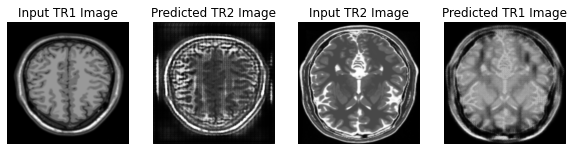

Saving checkpoint for epoch 43 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-43


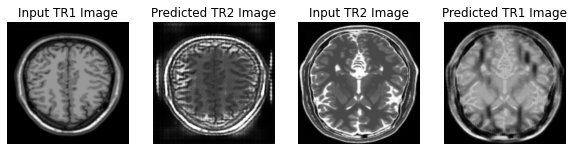

Saving checkpoint for epoch 44 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-44


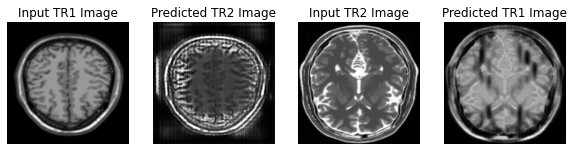

Saving checkpoint for epoch 45 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-45


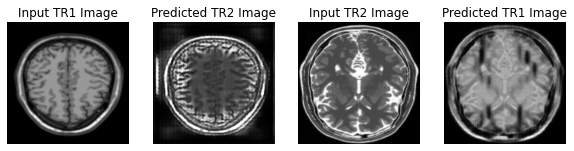

Saving checkpoint for epoch 46 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-46


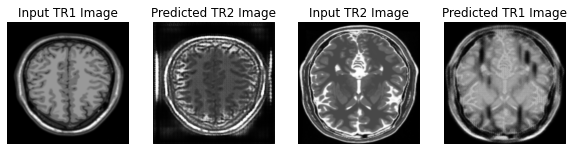

Saving checkpoint for epoch 47 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-47


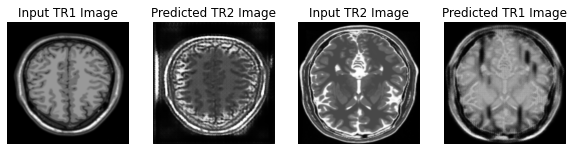

Saving checkpoint for epoch 48 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-48


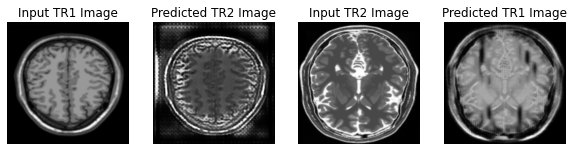

Saving checkpoint for epoch 49 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-49


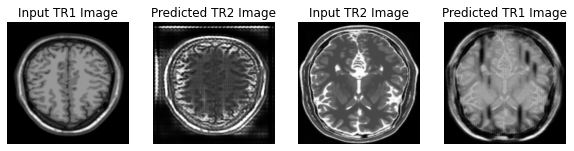

Saving checkpoint for epoch 50 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-50


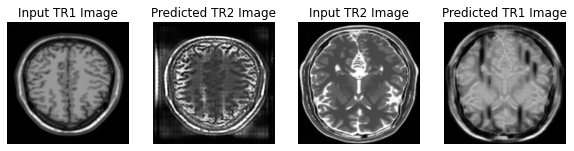

Saving checkpoint for epoch 51 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-51


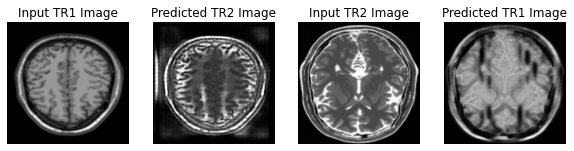

Saving checkpoint for epoch 52 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-52


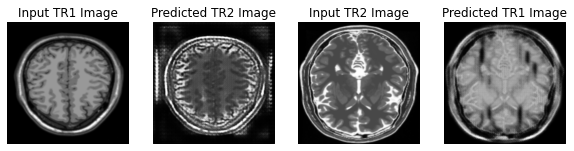

Saving checkpoint for epoch 53 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-53


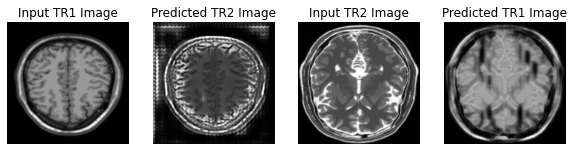

Saving checkpoint for epoch 54 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-54


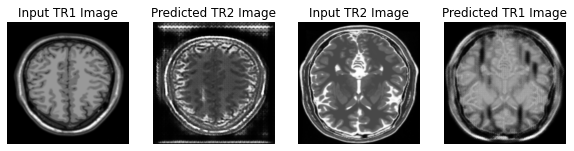

Saving checkpoint for epoch 55 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-55


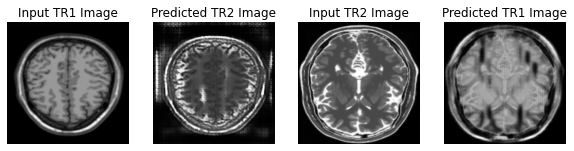

Saving checkpoint for epoch 56 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-56


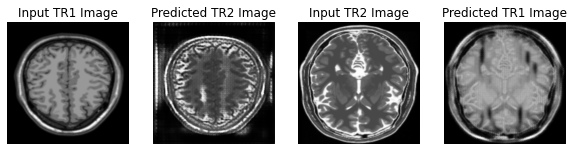

Saving checkpoint for epoch 57 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-57


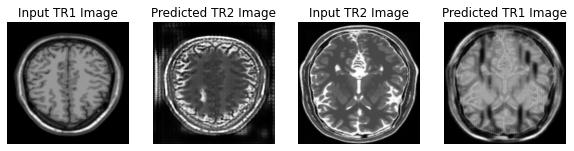

Saving checkpoint for epoch 58 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-58


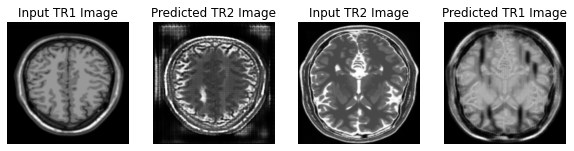

Saving checkpoint for epoch 59 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-59


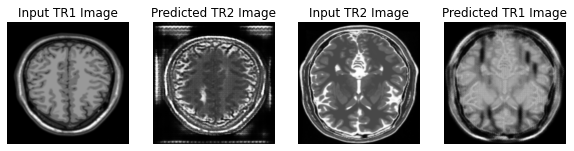

Saving checkpoint for epoch 60 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-60


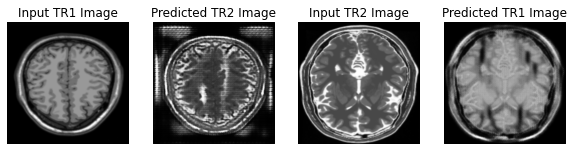

Saving checkpoint for epoch 61 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-61


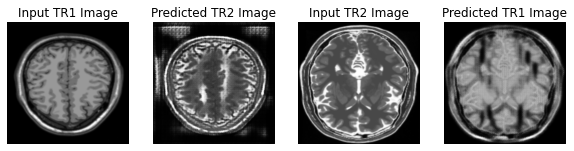

Saving checkpoint for epoch 62 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-62


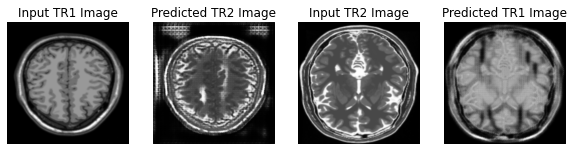

Saving checkpoint for epoch 63 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-63


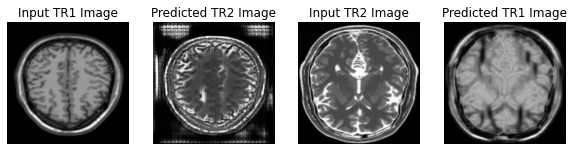

Saving checkpoint for epoch 64 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-64


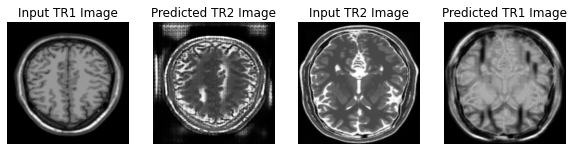

Saving checkpoint for epoch 65 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-65


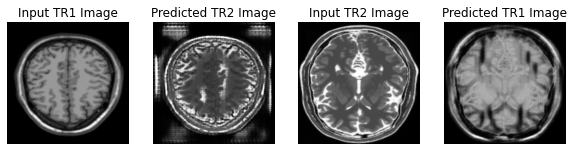

Saving checkpoint for epoch 66 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-66


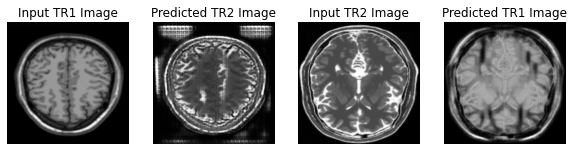

Saving checkpoint for epoch 67 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-67


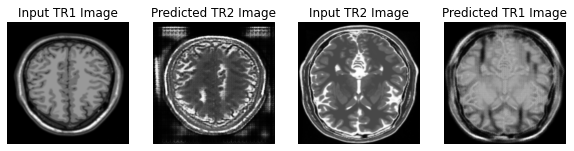

Saving checkpoint for epoch 68 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-68


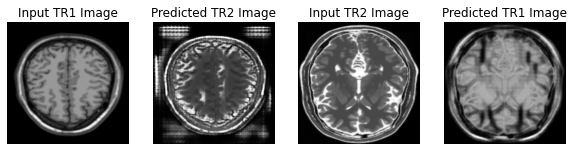

Saving checkpoint for epoch 69 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-69


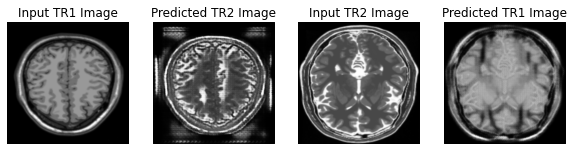

Saving checkpoint for epoch 70 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-70


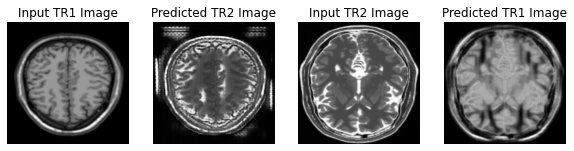

Saving checkpoint for epoch 71 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-71


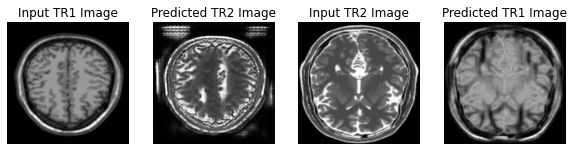

Saving checkpoint for epoch 72 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-72


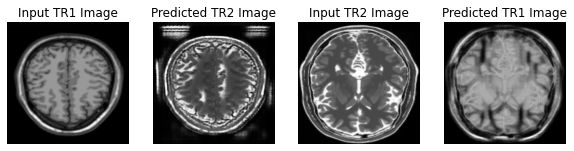

Saving checkpoint for epoch 73 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-73


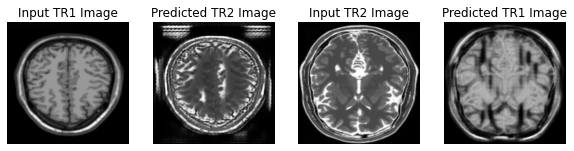

Saving checkpoint for epoch 74 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-74


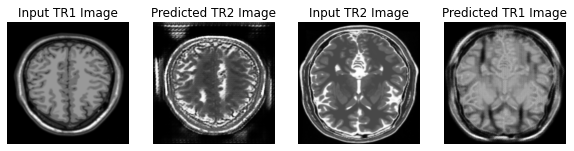

Saving checkpoint for epoch 75 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-75


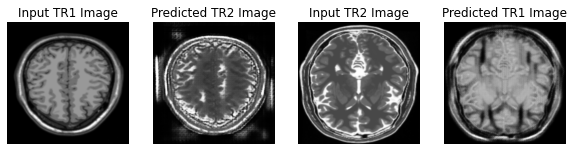

Saving checkpoint for epoch 76 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-76


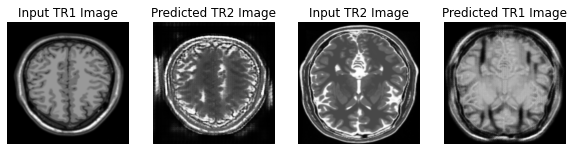

Saving checkpoint for epoch 77 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-77


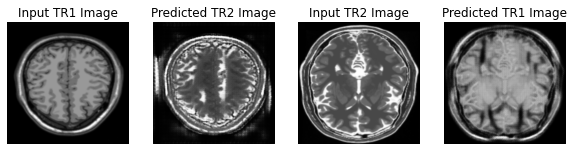

Saving checkpoint for epoch 78 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-78


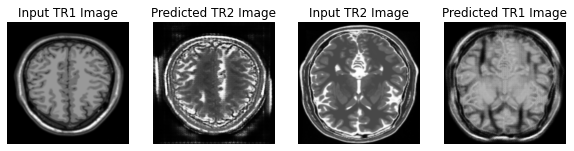

Saving checkpoint for epoch 79 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-79


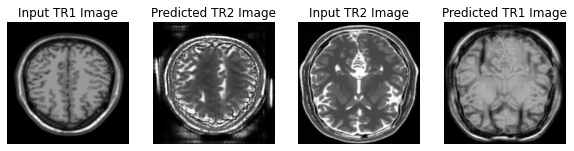

Saving checkpoint for epoch 80 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-80


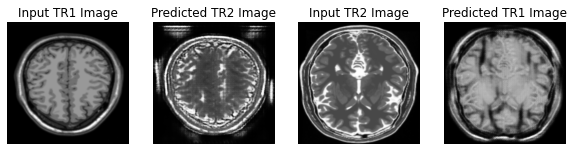

Saving checkpoint for epoch 81 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-81


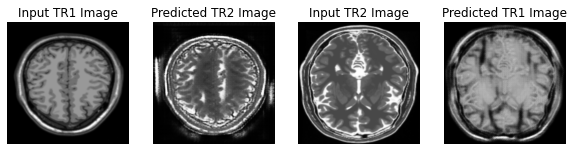

Saving checkpoint for epoch 82 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-82


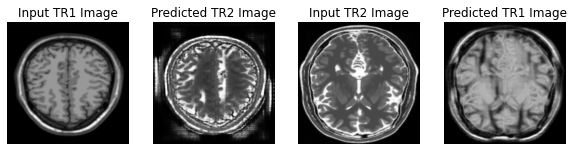

Saving checkpoint for epoch 83 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-83


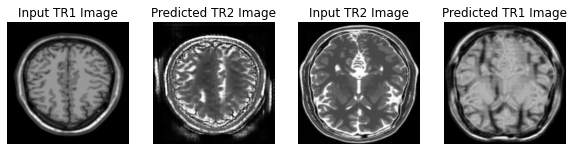

Saving checkpoint for epoch 84 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-84


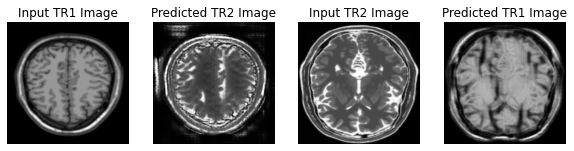

Saving checkpoint for epoch 85 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-85


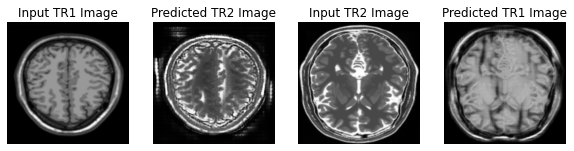

Saving checkpoint for epoch 86 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-86


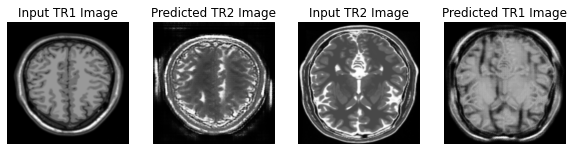

Saving checkpoint for epoch 87 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-87


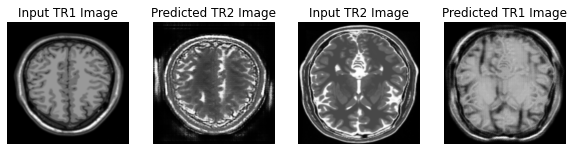

Saving checkpoint for epoch 88 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-88


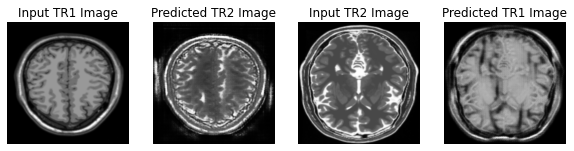

Saving checkpoint for epoch 89 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-89


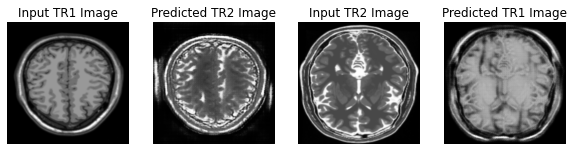

Saving checkpoint for epoch 90 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-90


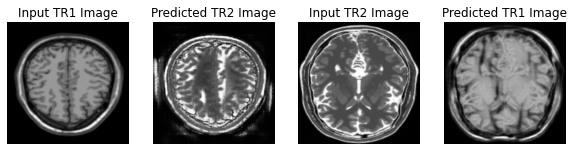

Saving checkpoint for epoch 91 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-91


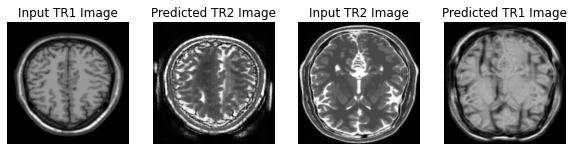

Saving checkpoint for epoch 92 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-92


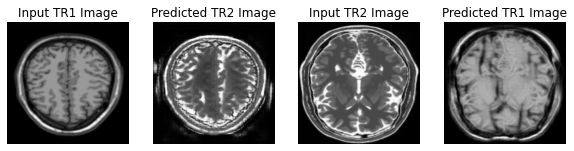

Saving checkpoint for epoch 93 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-93


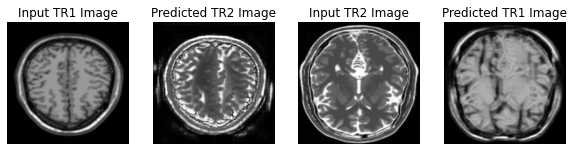

Saving checkpoint for epoch 94 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-94


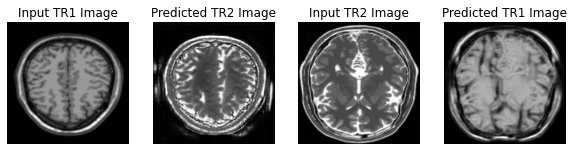

Saving checkpoint for epoch 95 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-95


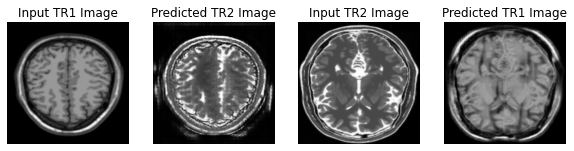

Saving checkpoint for epoch 96 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-96


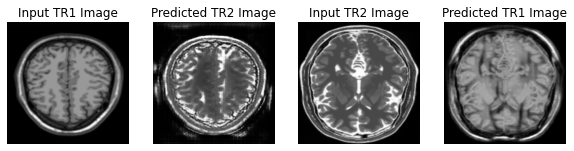

Saving checkpoint for epoch 97 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-97


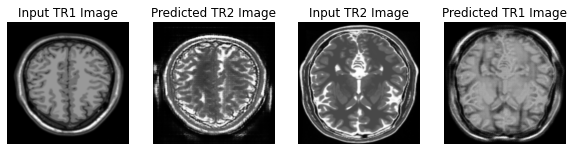

Saving checkpoint for epoch 98 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-98


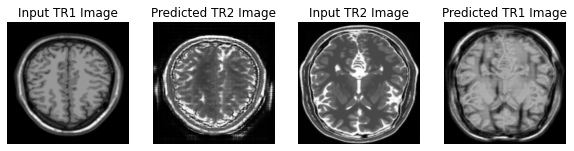

Saving checkpoint for epoch 99 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-99


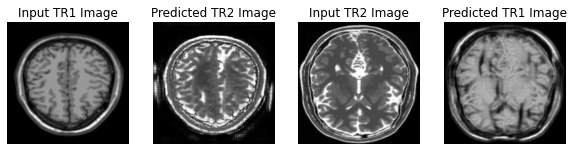

Saving checkpoint for epoch 100 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-100


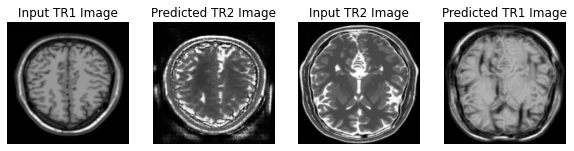

Saving checkpoint for epoch 101 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-101


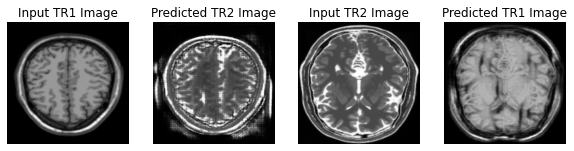

Saving checkpoint for epoch 102 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-102


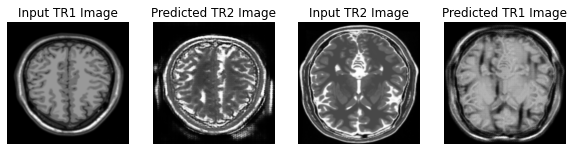

Saving checkpoint for epoch 103 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-103


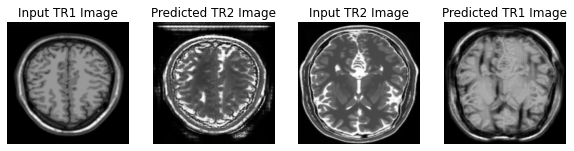

Saving checkpoint for epoch 104 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-104


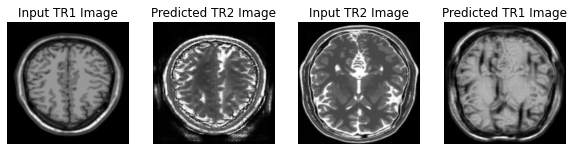

Saving checkpoint for epoch 105 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-105


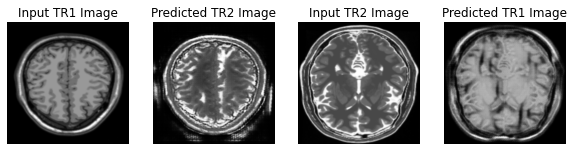

Saving checkpoint for epoch 106 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-106


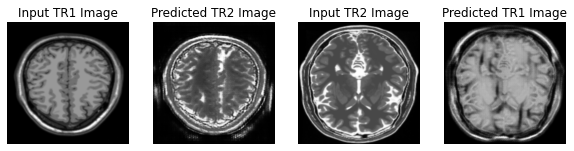

Saving checkpoint for epoch 107 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-107


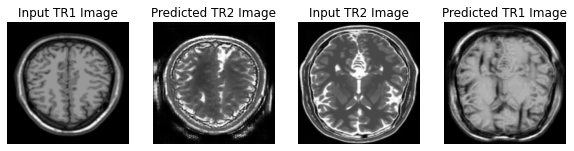

Saving checkpoint for epoch 108 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-108


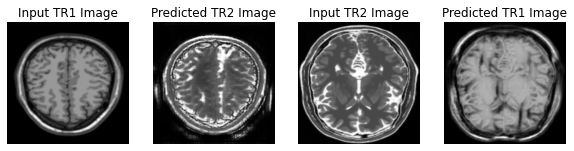

Saving checkpoint for epoch 109 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-109


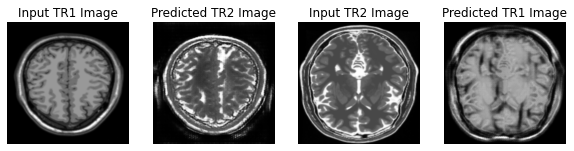

Saving checkpoint for epoch 110 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-110


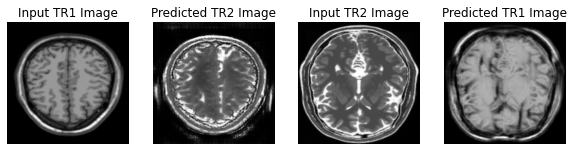

Saving checkpoint for epoch 111 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-111


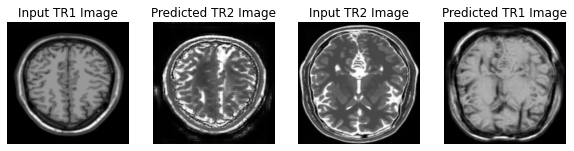

Saving checkpoint for epoch 112 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-112


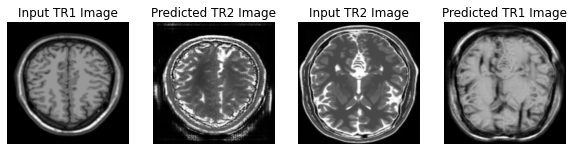

Saving checkpoint for epoch 113 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-113


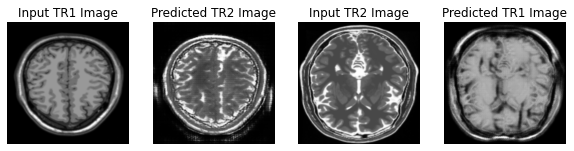

Saving checkpoint for epoch 114 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-114


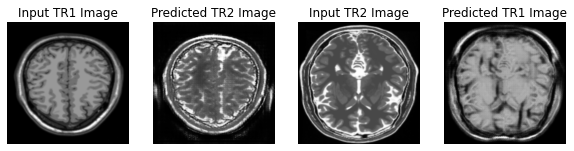

Saving checkpoint for epoch 115 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-115


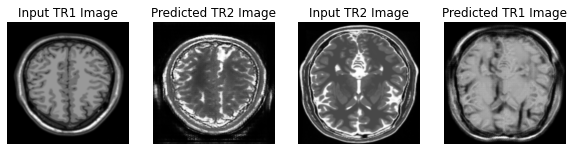

Saving checkpoint for epoch 116 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-116


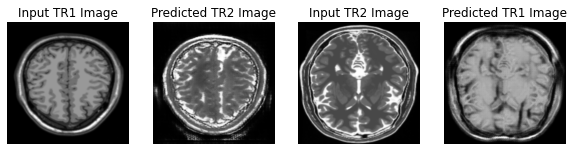

Saving checkpoint for epoch 117 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-117


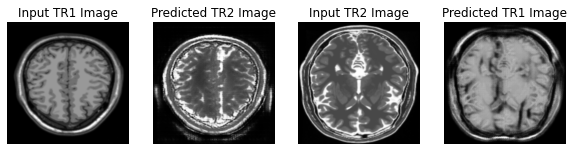

Saving checkpoint for epoch 118 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-118


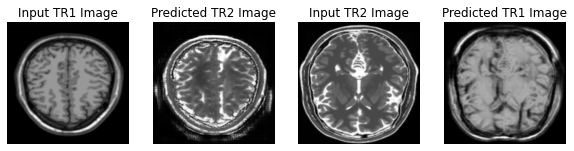

Saving checkpoint for epoch 119 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-119


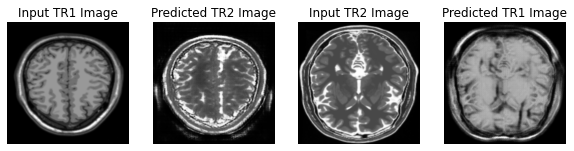

Saving checkpoint for epoch 120 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-120


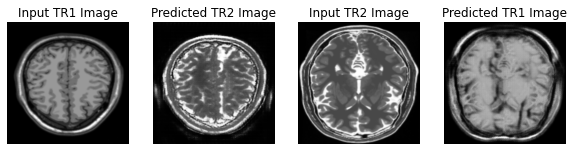

Saving checkpoint for epoch 121 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-121


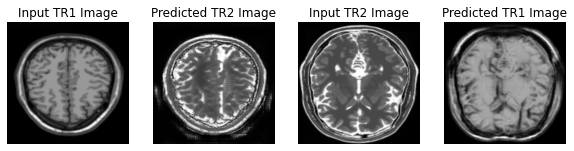

Saving checkpoint for epoch 122 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-122


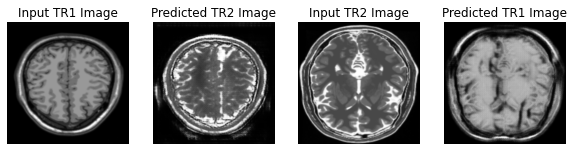

Saving checkpoint for epoch 123 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-123


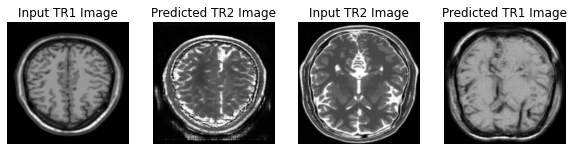

Saving checkpoint for epoch 124 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-124


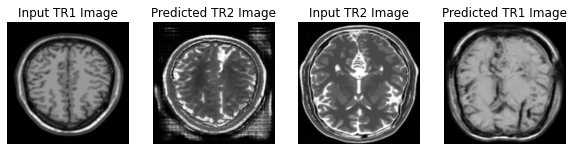

Saving checkpoint for epoch 125 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-125


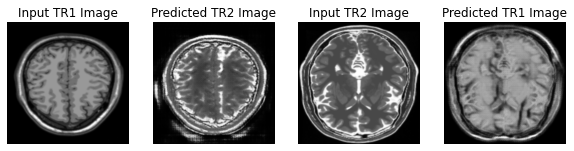

Saving checkpoint for epoch 126 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-126


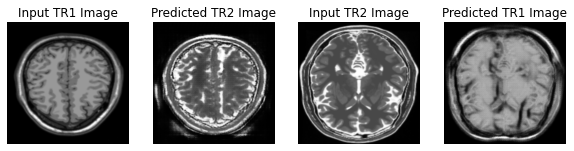

Saving checkpoint for epoch 127 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-127


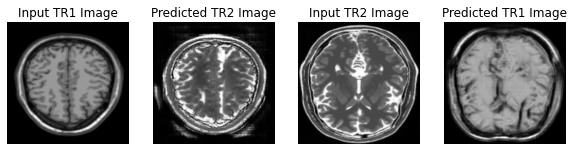

Saving checkpoint for epoch 128 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-128


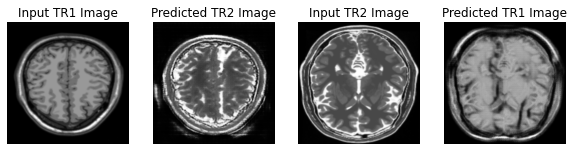

Saving checkpoint for epoch 129 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-129


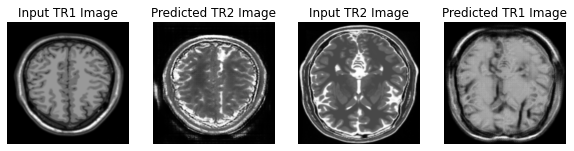

Saving checkpoint for epoch 130 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-130


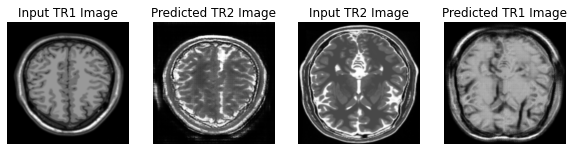

Saving checkpoint for epoch 131 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-131


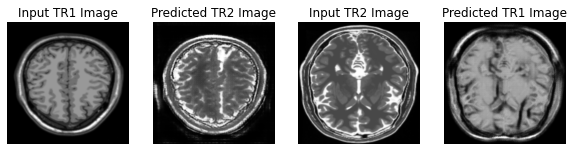

Saving checkpoint for epoch 132 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-132


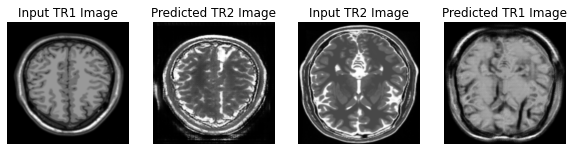

Saving checkpoint for epoch 133 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-133


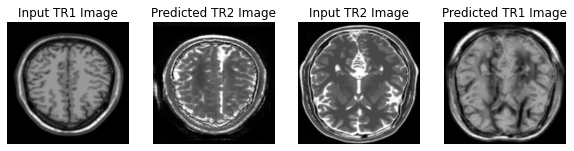

Saving checkpoint for epoch 134 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-134


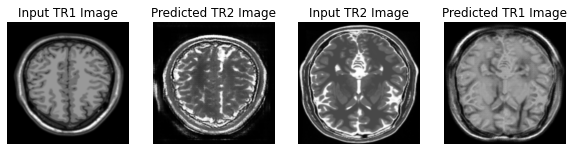

Saving checkpoint for epoch 135 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-135


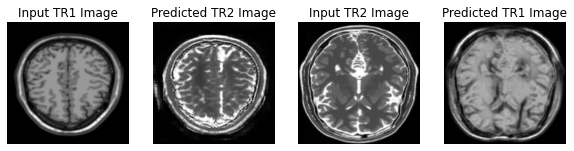

Saving checkpoint for epoch 136 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-136


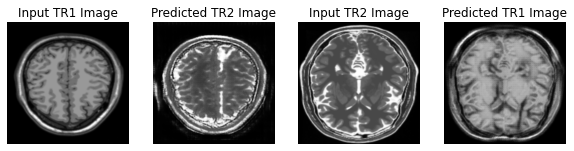

Saving checkpoint for epoch 137 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-137


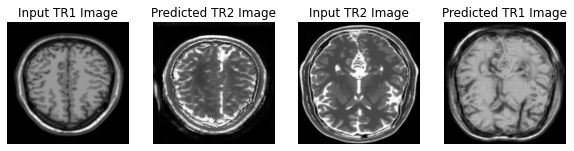

Saving checkpoint for epoch 138 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-138


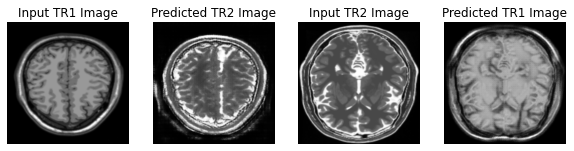

Saving checkpoint for epoch 139 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-139


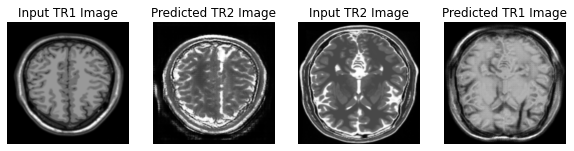

Saving checkpoint for epoch 140 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-140


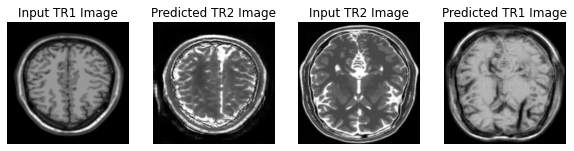

Saving checkpoint for epoch 141 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-141


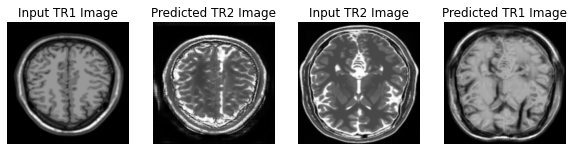

Saving checkpoint for epoch 142 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-142


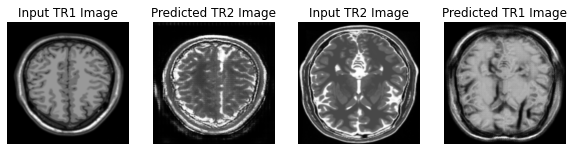

Saving checkpoint for epoch 143 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-143


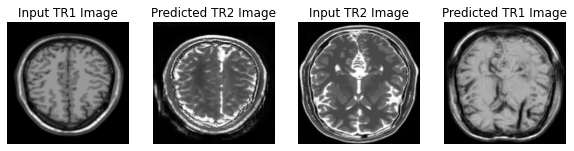

Saving checkpoint for epoch 144 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-144


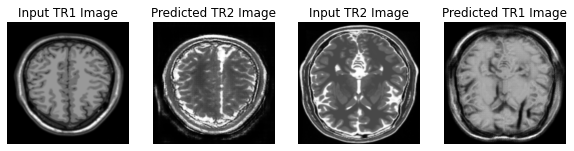

Saving checkpoint for epoch 145 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-145


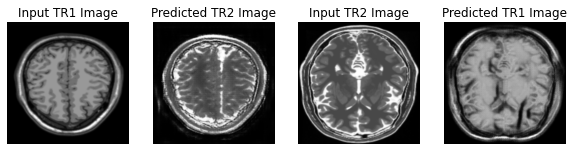

Saving checkpoint for epoch 146 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-146


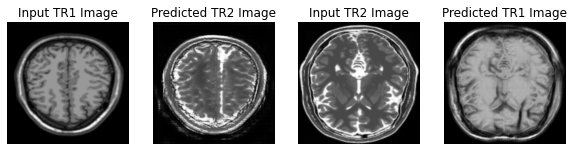

Saving checkpoint for epoch 147 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-147


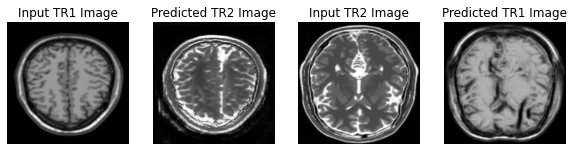

Saving checkpoint for epoch 148 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-148


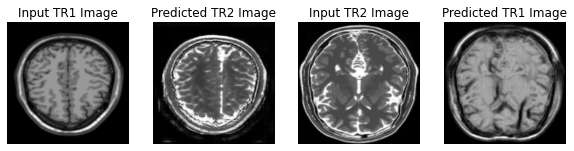

Saving checkpoint for epoch 149 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-149


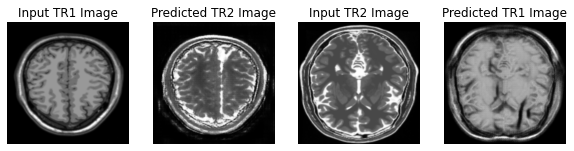

Saving checkpoint for epoch 150 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-150


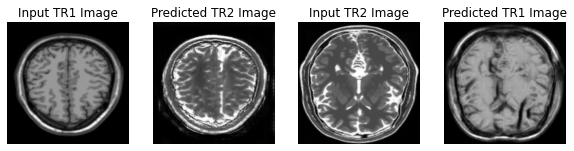

Saving checkpoint for epoch 151 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-151


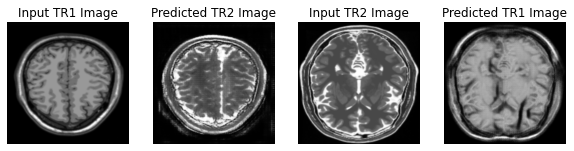

Saving checkpoint for epoch 152 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-152


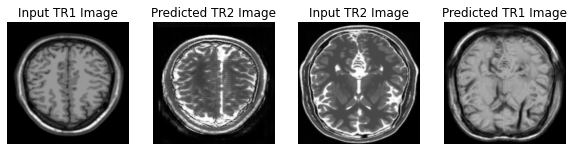

Saving checkpoint for epoch 153 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-153


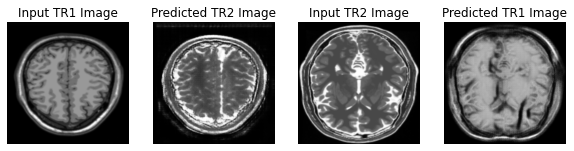

Saving checkpoint for epoch 154 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-154


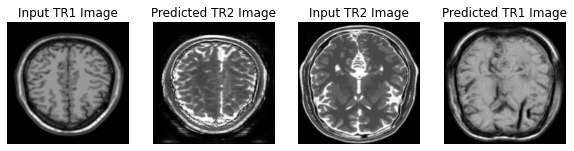

Saving checkpoint for epoch 155 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-155


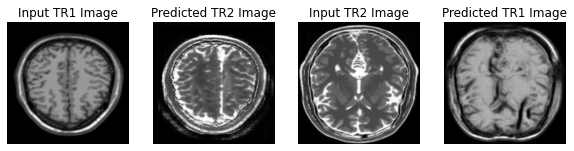

Saving checkpoint for epoch 156 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-156


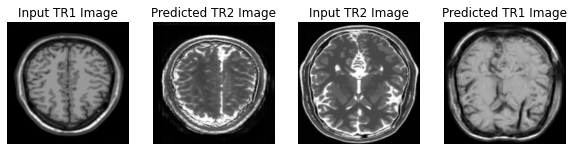

Saving checkpoint for epoch 157 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-157


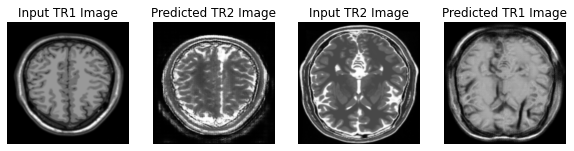

Saving checkpoint for epoch 158 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-158


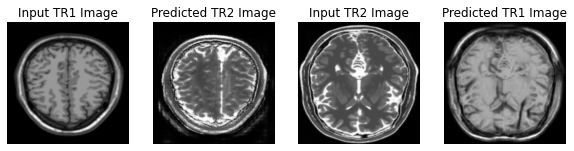

Saving checkpoint for epoch 159 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-159


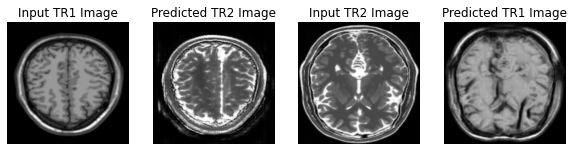

Saving checkpoint for epoch 160 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-160


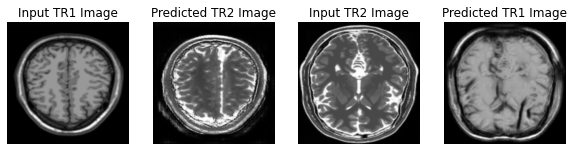

Saving checkpoint for epoch 161 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-161


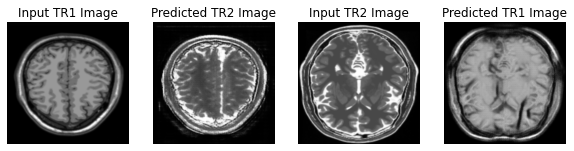

Saving checkpoint for epoch 162 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-162


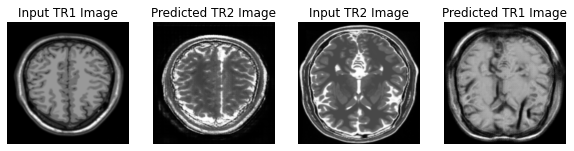

Saving checkpoint for epoch 163 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-163


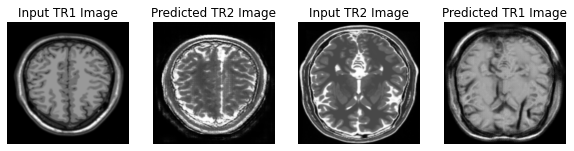

Saving checkpoint for epoch 164 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-164


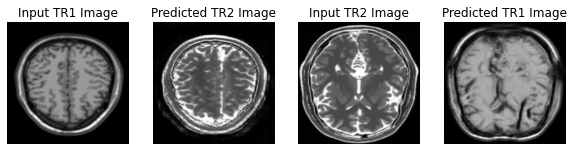

Saving checkpoint for epoch 165 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-165


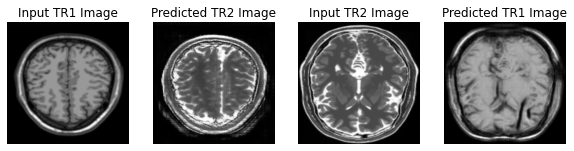

Saving checkpoint for epoch 166 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-166


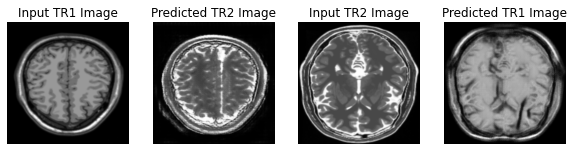

Saving checkpoint for epoch 167 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-167


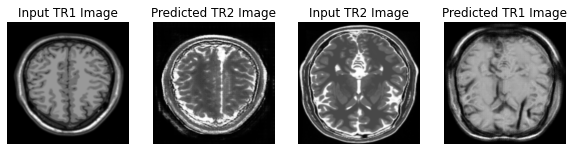

Saving checkpoint for epoch 168 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-168


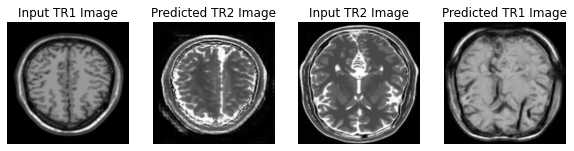

Saving checkpoint for epoch 169 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-169


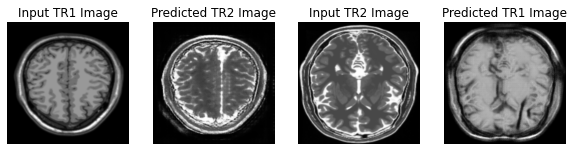

Saving checkpoint for epoch 170 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-170


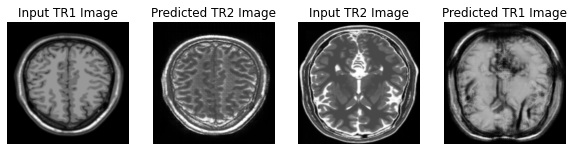

Saving checkpoint for epoch 171 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-171


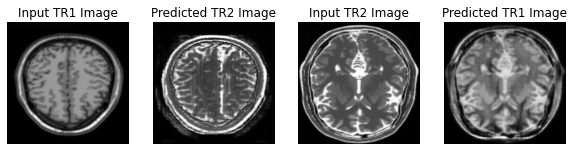

Saving checkpoint for epoch 172 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-172


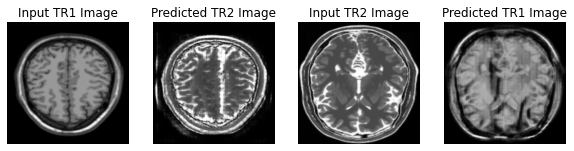

Saving checkpoint for epoch 173 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-173


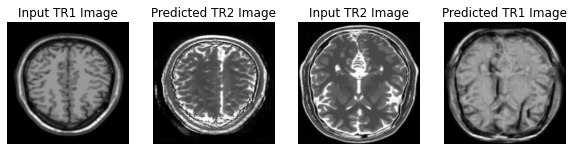

Saving checkpoint for epoch 174 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-174


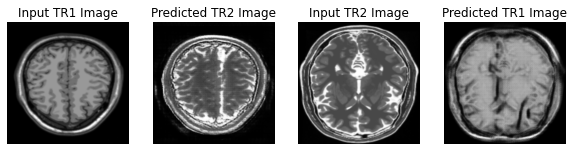

Saving checkpoint for epoch 175 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-175


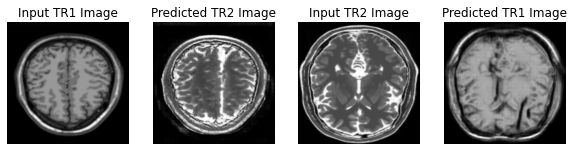

Saving checkpoint for epoch 176 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-176


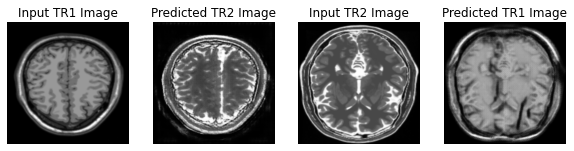

Saving checkpoint for epoch 177 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-177


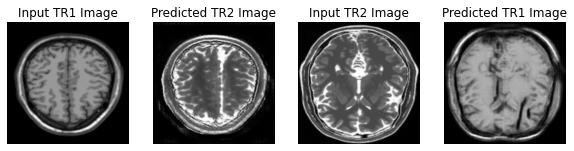

Saving checkpoint for epoch 178 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-178


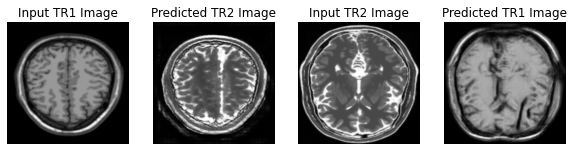

Saving checkpoint for epoch 179 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-179


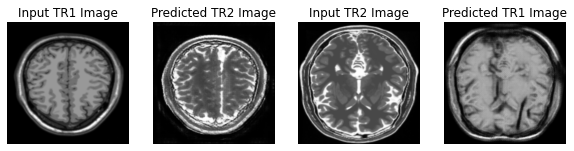

Saving checkpoint for epoch 180 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-180


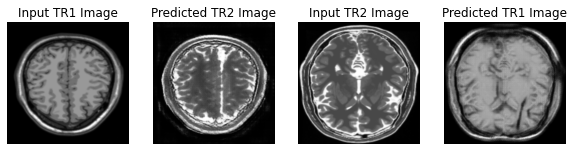

Saving checkpoint for epoch 181 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-181


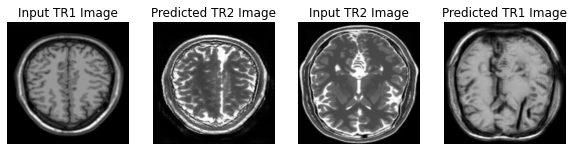

Saving checkpoint for epoch 182 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-182


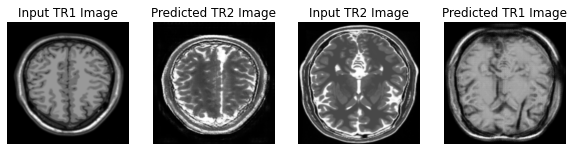

Saving checkpoint for epoch 183 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-183


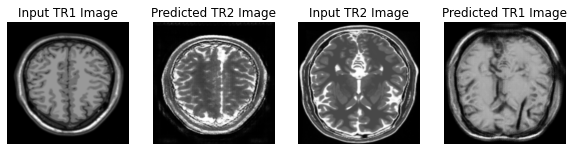

Saving checkpoint for epoch 184 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-184


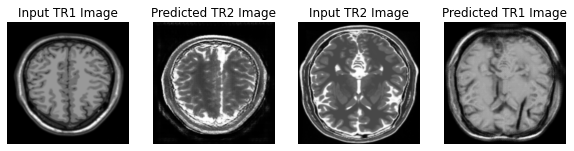

Saving checkpoint for epoch 185 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-185


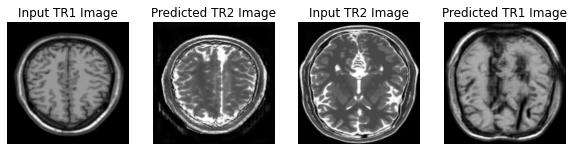

Saving checkpoint for epoch 186 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-186


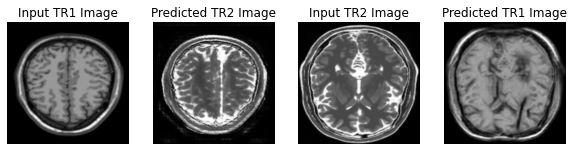

Saving checkpoint for epoch 187 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-187


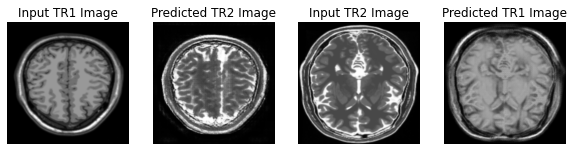

Saving checkpoint for epoch 188 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-188


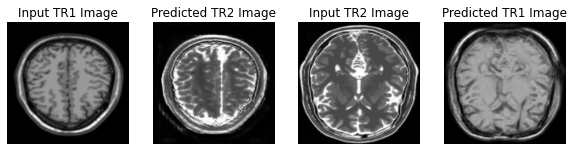

Saving checkpoint for epoch 189 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-189


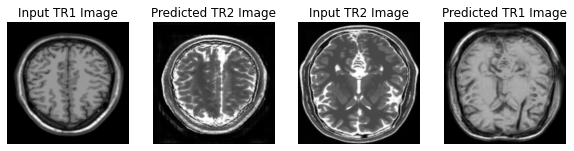

Saving checkpoint for epoch 190 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-190


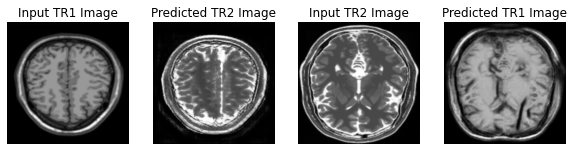

Saving checkpoint for epoch 191 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-191


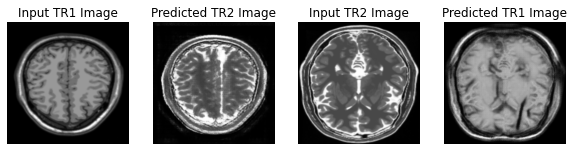

Saving checkpoint for epoch 192 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-192


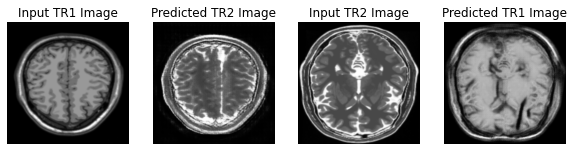

Saving checkpoint for epoch 193 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-193


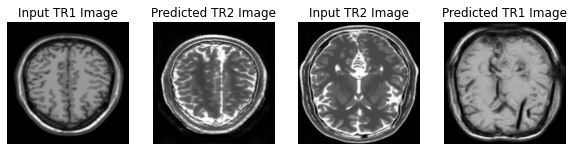

Saving checkpoint for epoch 194 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-194


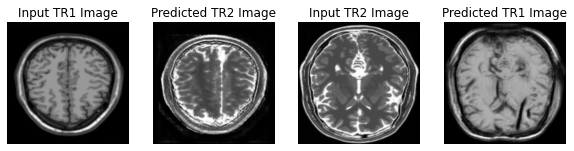

Saving checkpoint for epoch 195 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-195


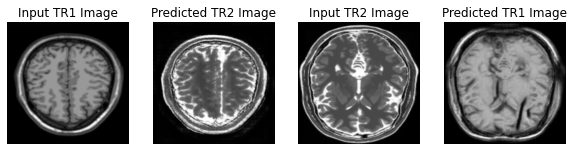

Saving checkpoint for epoch 196 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-196


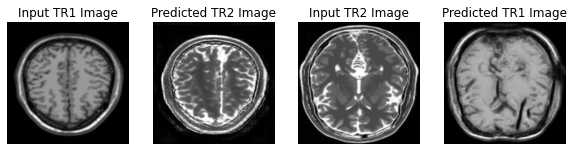

Saving checkpoint for epoch 197 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-197


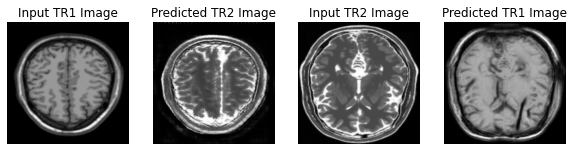

Saving checkpoint for epoch 198 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-198


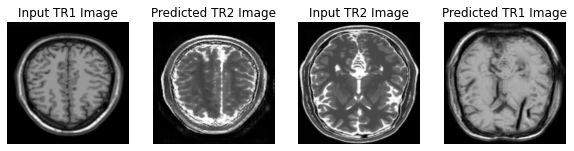

Saving checkpoint for epoch 199 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-199


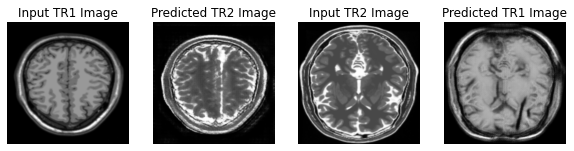

Saving checkpoint for epoch 200 at /content/drive/MyDrive/Colab Notebooks/Upgrad_Capstone_Project/Trained_Models/ckpt-200


In [38]:
for epoch in range(1,EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((tr1, tr2)):
        train_step(image_x, image_y)
    generate_images(generator_g, sample_tr1, generator_f, sample_tr2)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

#6. Prediction on Test Data

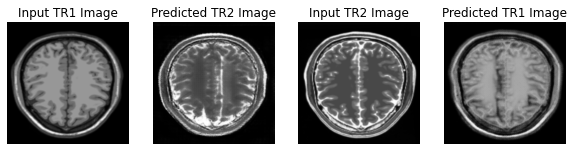

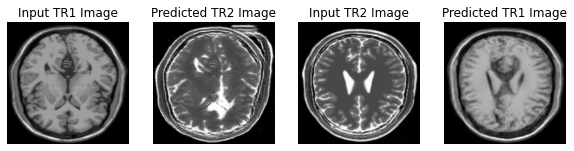

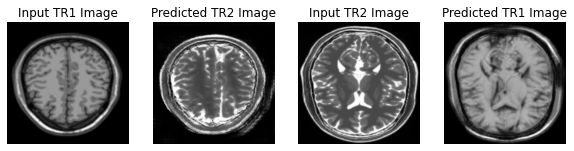

In [39]:
# Run the trained model on the test dataset
for image_x, image_y in tf.data.Dataset.zip((tr1_test, tr2_test)):
  generate_images(generator_g, image_x, generator_f, image_y)